In [62]:
import pandas as pd
import numpy as np
import sklearn 
from sklearn.datasets import load_boston
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import pandas_profiling as pp 

## Ładowanie zbioru danych

In [63]:
fires = pd.read_csv("forest_fires_dataset.csv")
fires.info() #zbiór bez braków danych

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


## Rozkłady zmiennych

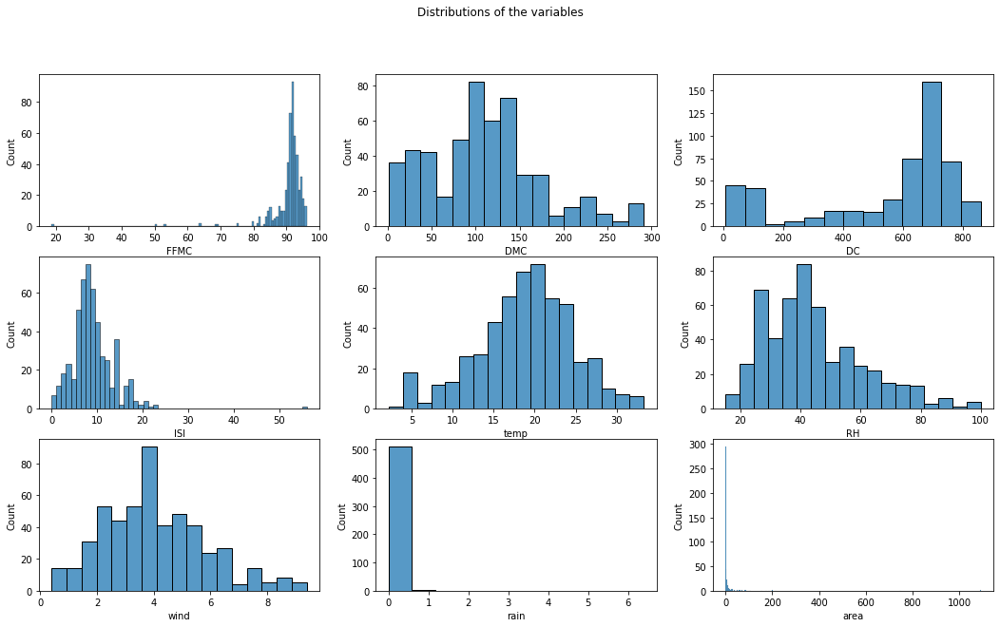

In [73]:
def distributions():
    dist_plot, axes = plt.subplots(3, 3, figsize=(18, 10))
    dist_plot.suptitle('Distributions of the variables')
    a = 0
    b = 0
    for col in fires.columns[4:]:
        sns.histplot(ax=axes[b, a], data=fires, x=col)
        a = a+1
        if a == 3:
            a = 0
            b = b+1

distributions()

## Wnioski:
1. Rozkład temperatury powietrza jest zbliżony do rozkładu normalnego
2. Rozkłady współczynnika FFMC, ISI oraz siły wiatru są w przybliżeniu rozkładami symetrycznymi
3. Zlogarytmowane rozkłady zmiennych rain oraz area będą wyglądały czytelniej

### Zamiana skali na logarytmiczną

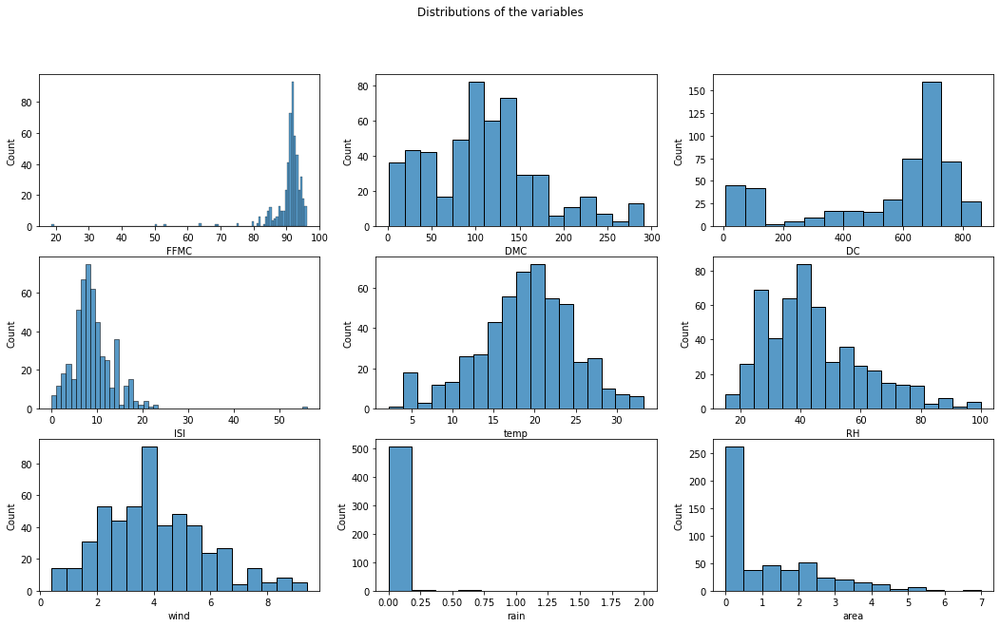

In [75]:
#sns.histplot(data = fires, x = np.log1p(fires['area']))
#sns.histplot(data = fires, x = np.log1p(fires['rain']))

fires['rain'] = np.log1p(fires['rain'])
fires['area'] = np.log1p(fires['area'])
distributions()

### Przedstawienie liczby pożarów w danych miesiącach

month
jan      2
feb     20
mar     54
apr      9
may      2
jun     17
jul     32
aug    184
sep    172
oct     15
nov      1
dec      9
dtype: int64

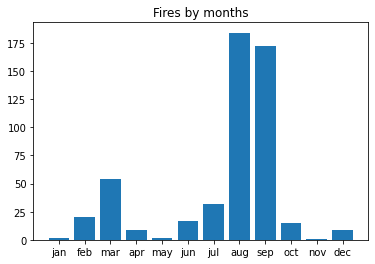

In [76]:
counted = fires.groupby('month').size()
new_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
counted = counted.reindex(new_order, axis=0)
plt.bar(x = counted.index, height = counted.values)
plt.title("Fires by months")

counted

#####  ~69% pożarów ma miejsce w sierpniu oraz wrześniu, 10% w marcu, natomiast pozostałe pożary przypadają na resztę miesięcy.

## Sprawdzenie zależności dwuwymiarowych
### Badanie wpływu poszczególnych czynników na wielkość pożaru

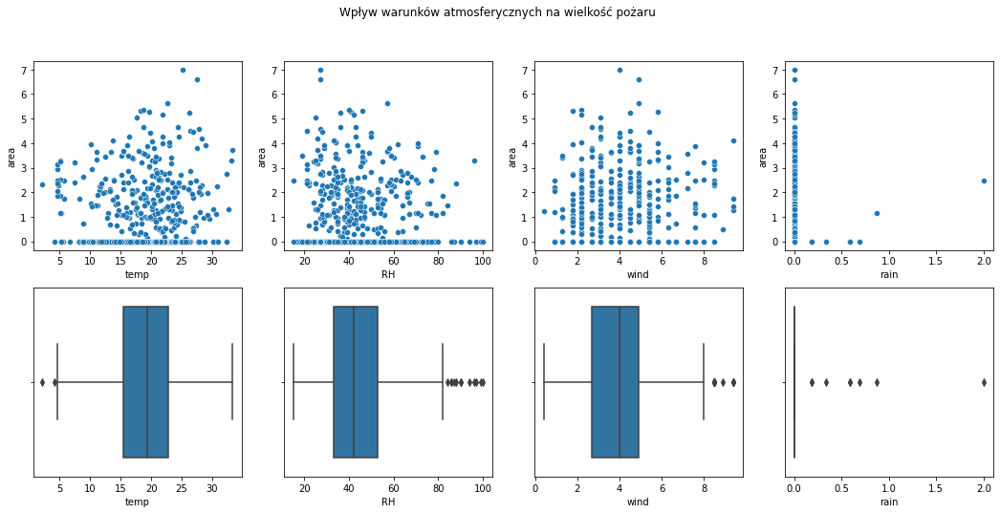

In [77]:
def areaplot(vec, title):
    area_scatter, axes = plt.subplots(2, 4, figsize=(18, 8))
    area_scatter.suptitle(title)
    a = 0
    b = 0
    for col in fires.columns[vec]:
        sns.scatterplot(ax = axes[0, b], data = fires, x = col, y = 'area')
        sns.boxplot(ax = axes[1, b], data = fires, x = col)
        b = b+1
        
areaplot([8, 9, 10, 11], "Wpływ warunków atmosferycznych na wielkość pożaru")

#### Połowa obserwowanych pożarów miała miejsce w temperaturach ok. 15-23 stopni, wilgotności ok. 32%-54% oraz przy braku opadów atmosferycznych. 

### Wpływ poszczególnych wskaźniów na wielkość pożaru

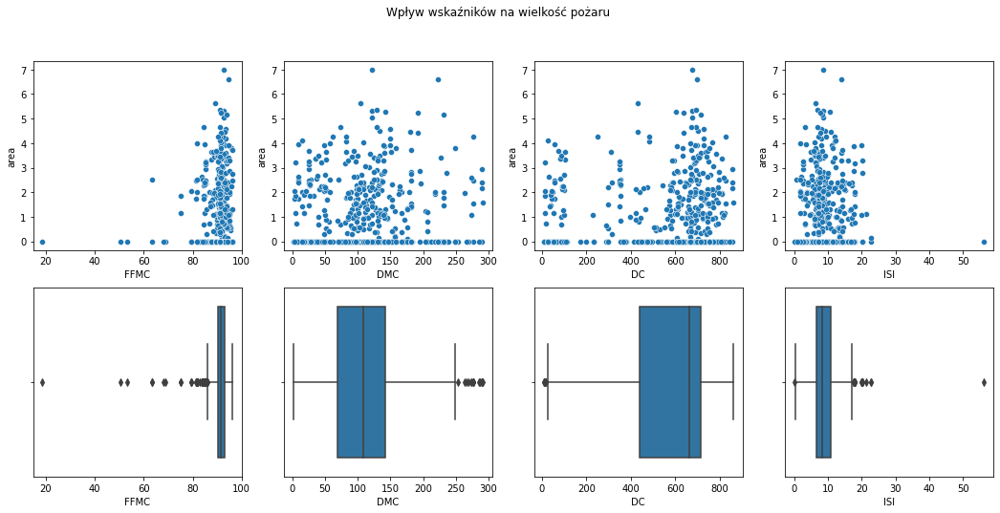

In [78]:
areaplot([4, 5, 6, 7], "Wpływ wskaźników na wielkość pożaru")

## Eksploracja danych z użyciem Pandas profiling

In [3]:
pp.ProfileReport(fires)

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Ograniczenia narzędzia Pandas profiling:
1. Trudno zaobserwować wartości odstające
2. Wraz ze wzrostem wielkości danych zwiększa się czas generowania raportu, zatem dla generowania raportu z dużych danych konieczne może być wzięcie jedynie próbki danych
3. Inne typy wykresów również mogą dostarczyć cennych informacji, np. boxplot.
